In [61]:
%matplotlib inline
from chainer import Variable, serializers
import chainer.links as L
import numpy as np
import matplotlib.pyplot as plt
import cv2
import urllib
import StringIO
import PIL.Image as Image
import sys
sys.path.append('../visualize')
from resnet import ResNet, GAP
import chainer.functions as F
import chainer.links as L
import glob

In [70]:
model = ResNet()
serializers.load_hdf5('../visualize/epoch50.model', model)
gap = L.Classifier(GAP())
serializers.load_hdf5('../results/2016-06-21_08-59-02/model', gap)
model.train = False
gap.predictor.train = False
test_sets = glob.glob('../data/test/*')
synsets = ['c0: safe driving',
           'c1: texting - right',
           'c2: talking on the phone - right',
           'c3: texting - left',
           'c4: talking on the phone - left',
           'c5: operating the radio',
           'c6: drinking',
           'c7: reaching behind',
           'c8: hair and makeup',
           'c9: talking to passenger']

c0: safe driving 0.934304


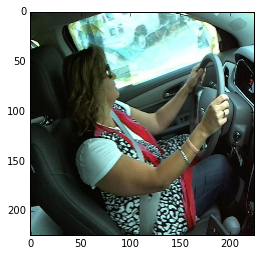

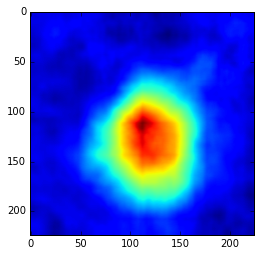

c3: texting - left 0.996101


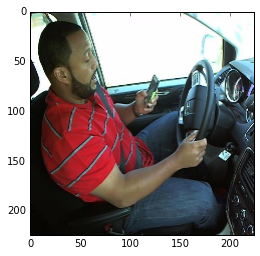

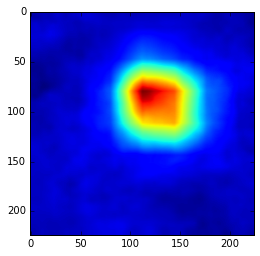

c9: talking to passenger 0.996555


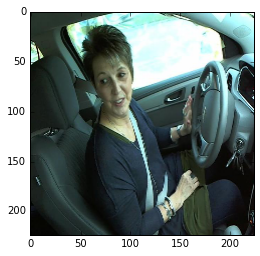

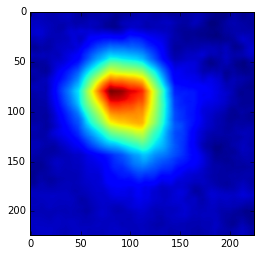

c6: drinking 0.648651


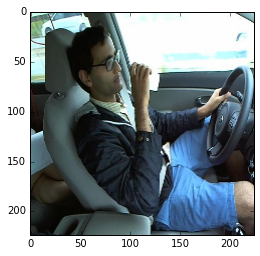

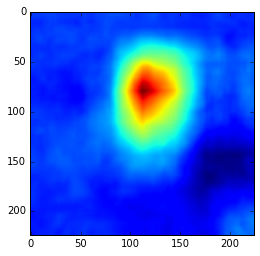

c9: talking to passenger 0.840023


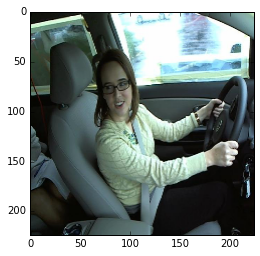

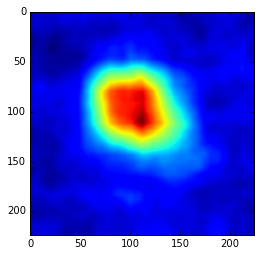

c3: texting - left 0.999549


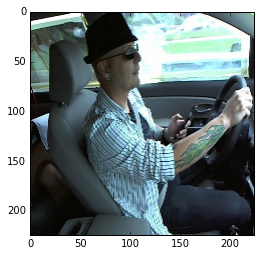

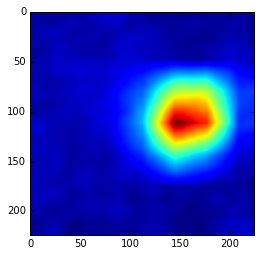

c3: texting - left 0.999245


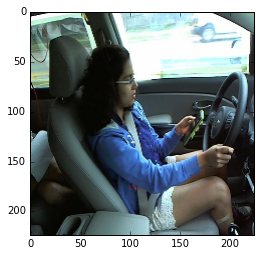

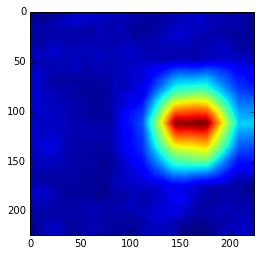

c2: talking on the phone - right 0.994571


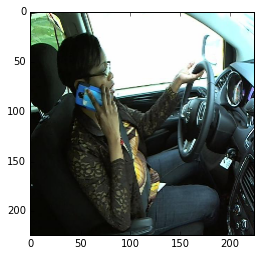

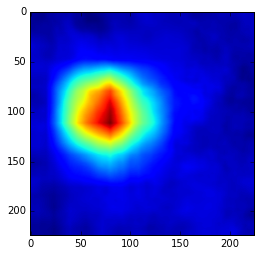

c3: texting - left 0.998876


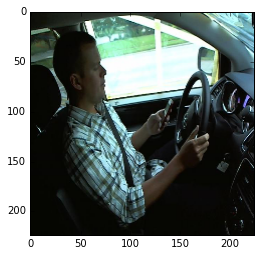

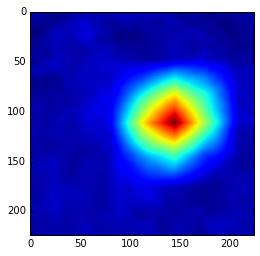

c6: drinking 0.997115


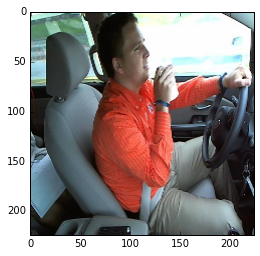

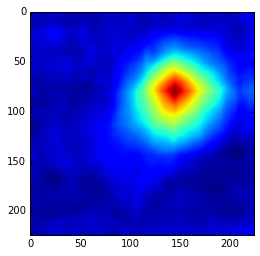

c2: talking on the phone - right 0.999285


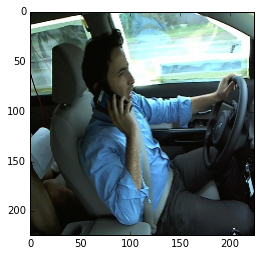

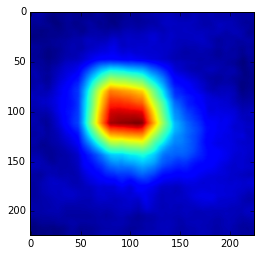

c8: hair and makeup 0.825753


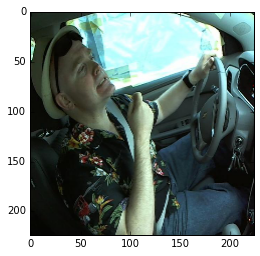

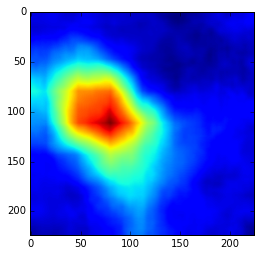

c5: operating the radio 0.999831


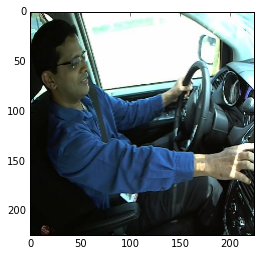

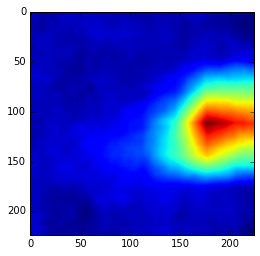

c1: texting - right 0.995968


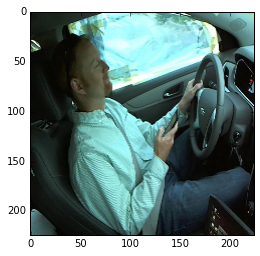

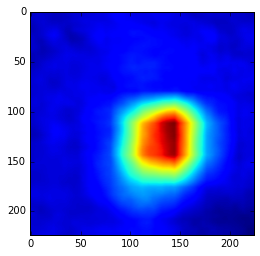

c4: talking on the phone - left 0.999799


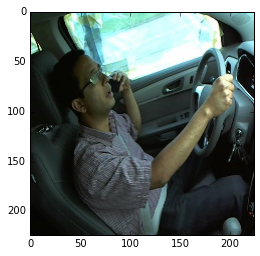

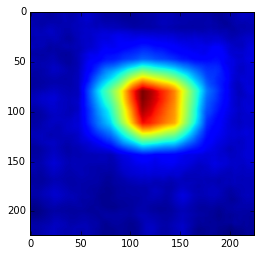

c8: hair and makeup 0.999807


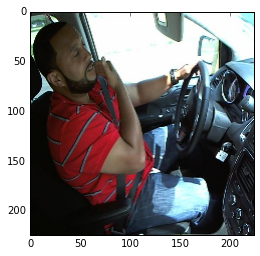

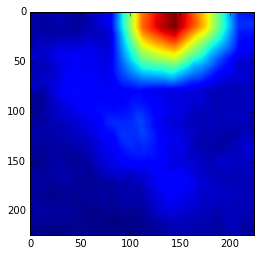

c2: talking on the phone - right 0.999536


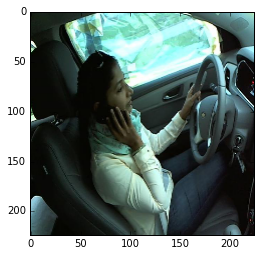

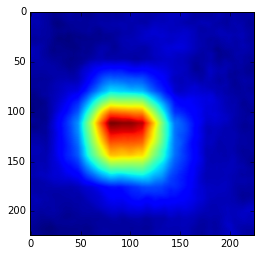

c9: talking to passenger 0.977875


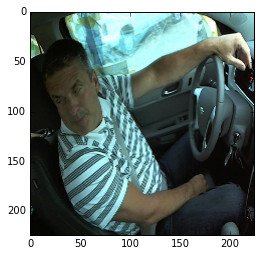

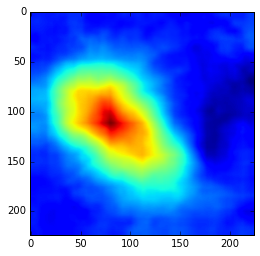

c0: safe driving 0.826696


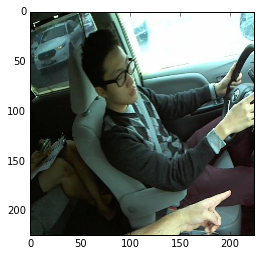

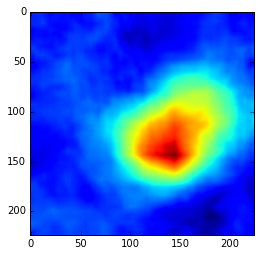

c4: talking on the phone - left 0.99349


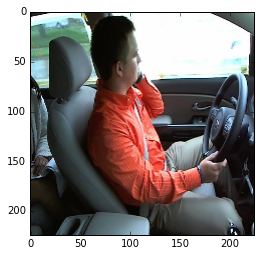

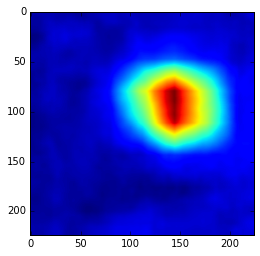

c6: drinking 0.590772


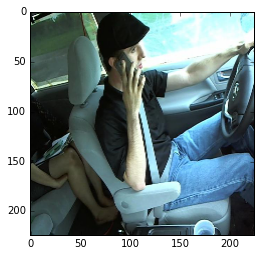

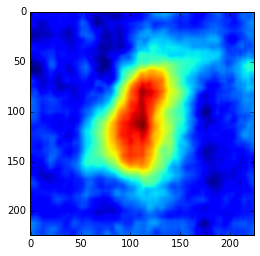

c2: talking on the phone - right 0.987791


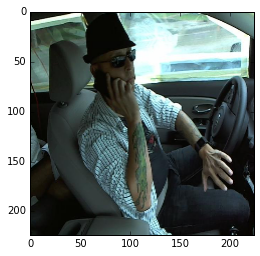

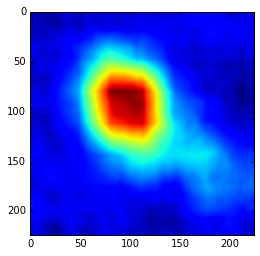

c6: drinking 0.999698


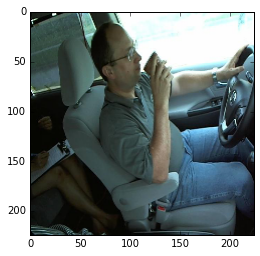

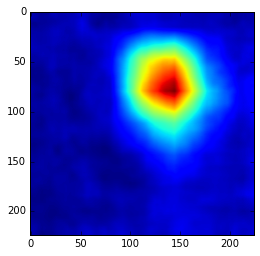

c3: texting - left 0.99855


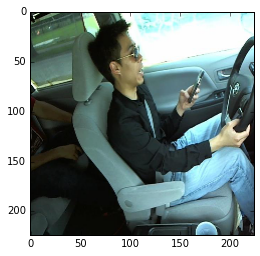

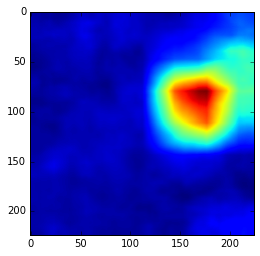

c8: hair and makeup 0.547786


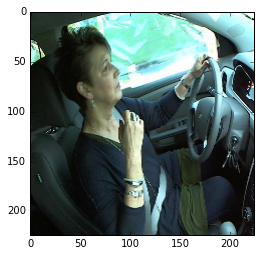

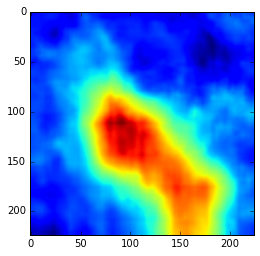

c5: operating the radio 0.999671


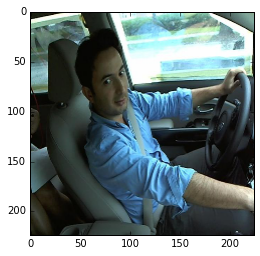

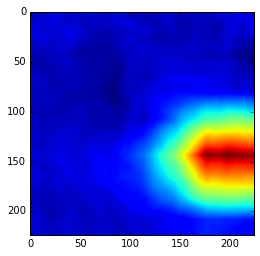

c0: safe driving 0.999074


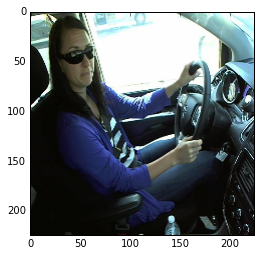

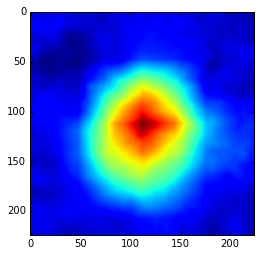

c1: texting - right 0.999815


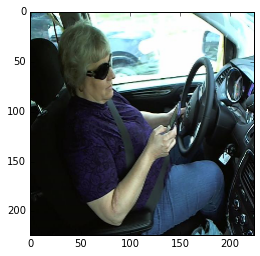

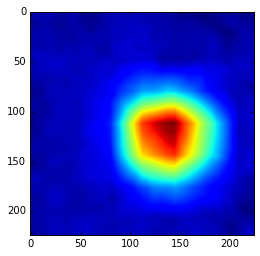

c3: texting - left 0.996127


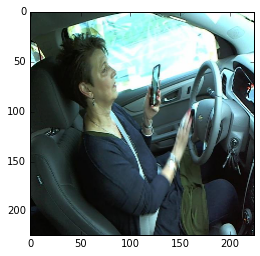

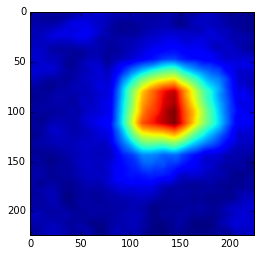

c1: texting - right 0.931316


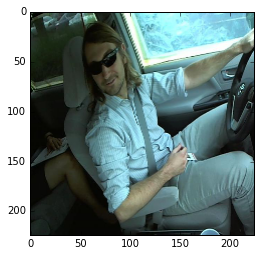

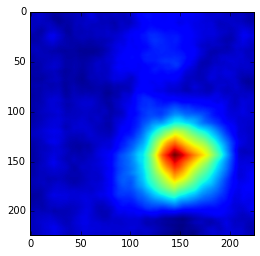

c4: talking on the phone - left 0.99939


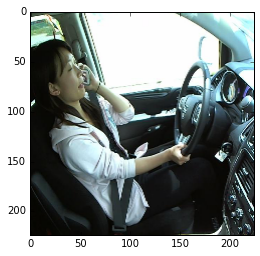

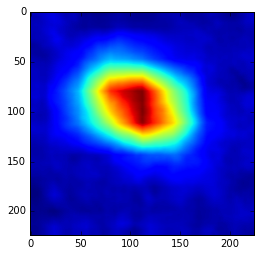

c1: texting - right 0.99356


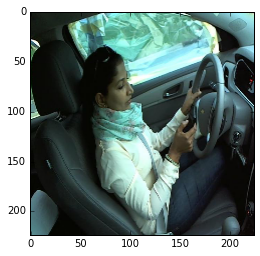

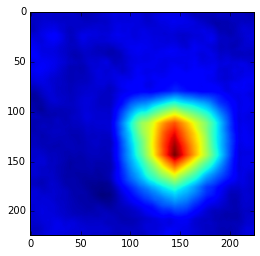

c8: hair and makeup 0.477023


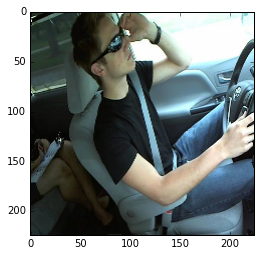

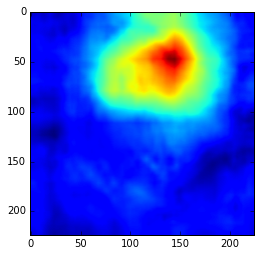

c2: talking on the phone - right 0.998546


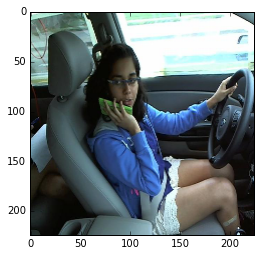

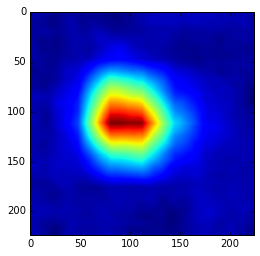

c1: texting - right 0.999948


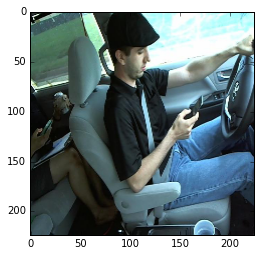

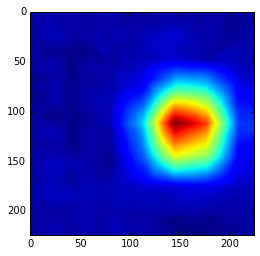

c8: hair and makeup 0.99808


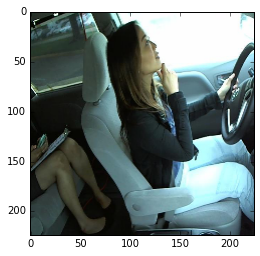

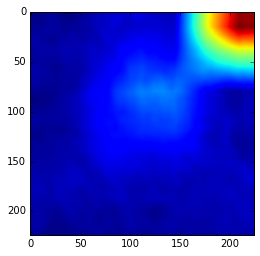

c9: talking to passenger 0.834068


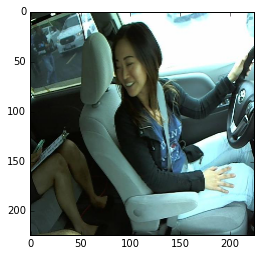

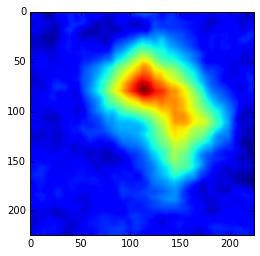

c5: operating the radio 0.999745


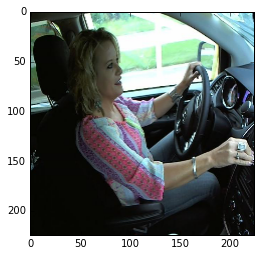

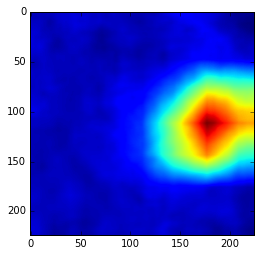

c6: drinking 0.798775


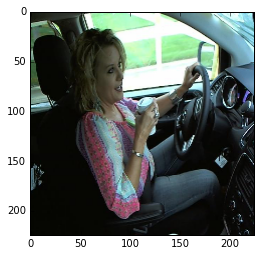

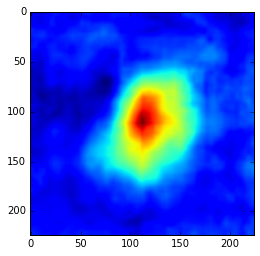

c3: texting - left 0.999691


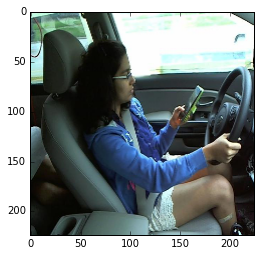

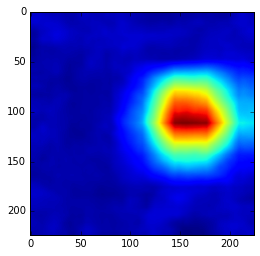

c1: texting - right 0.999175


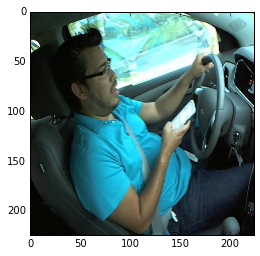

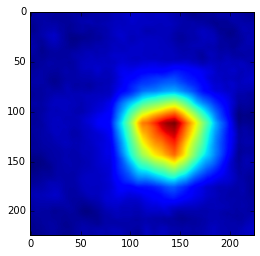

c0: safe driving 0.965361


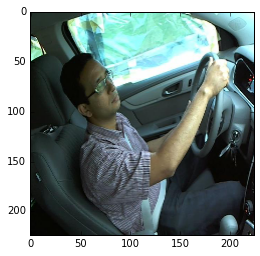

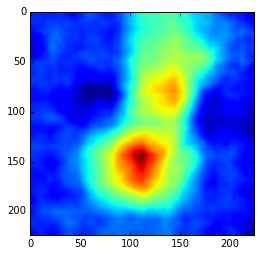

c9: talking to passenger 0.809919


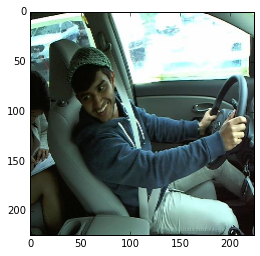

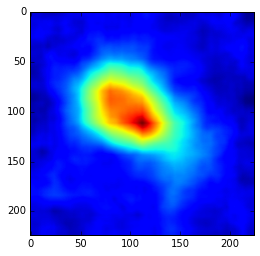

c4: talking on the phone - left 0.999569


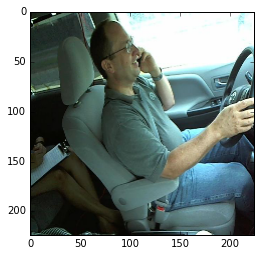

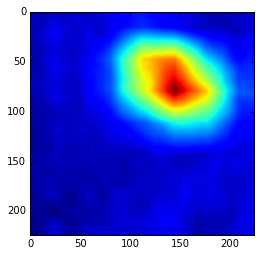

c5: operating the radio 0.99989


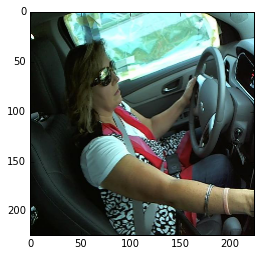

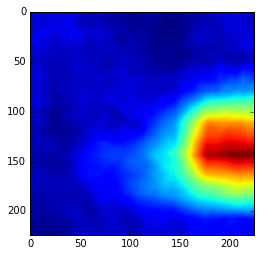

c4: talking on the phone - left 0.613956


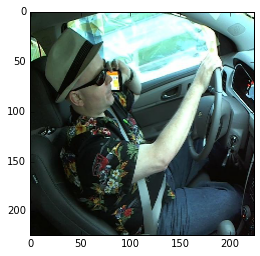

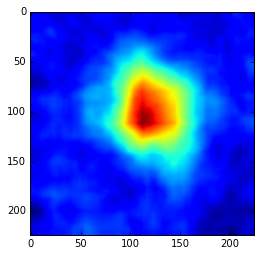

c5: operating the radio 0.999375


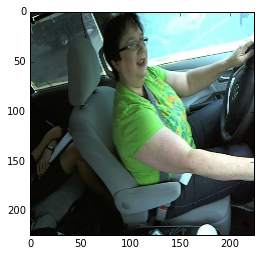

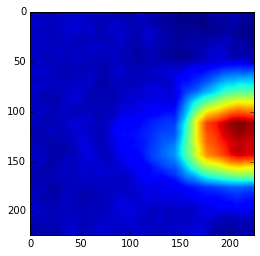

c1: texting - right 0.965823


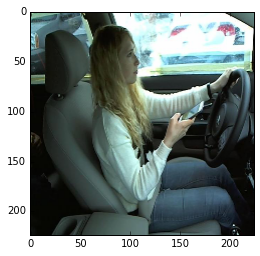

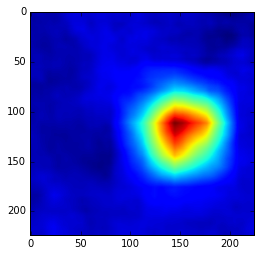

c7: reaching behind 0.999842


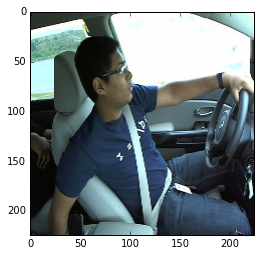

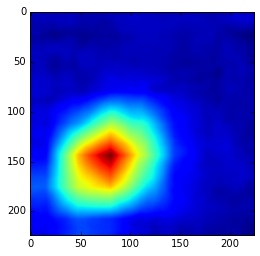

c0: safe driving 0.999156


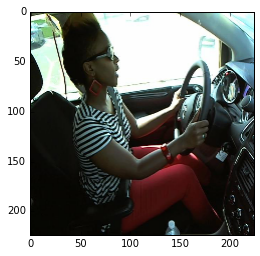

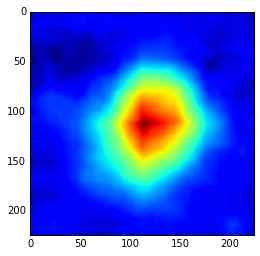

c5: operating the radio 0.999785


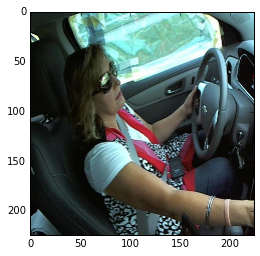

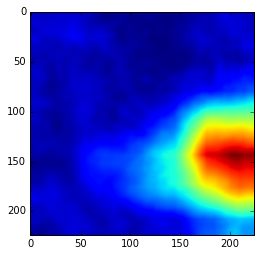

c8: hair and makeup 0.999812


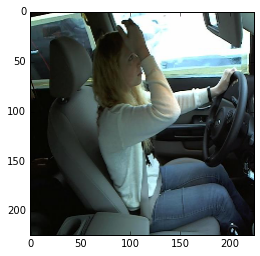

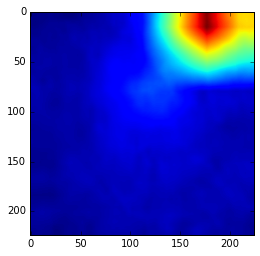

c0: safe driving 0.609545


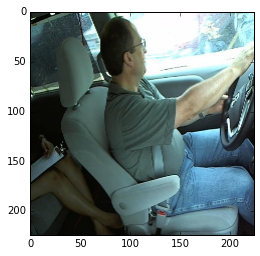

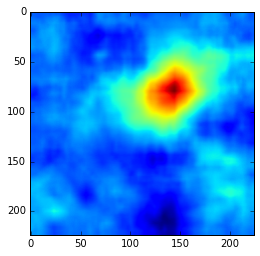

c4: talking on the phone - left 0.999559


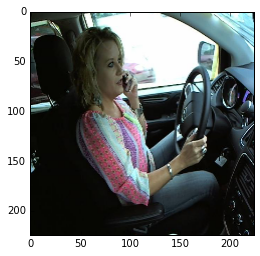

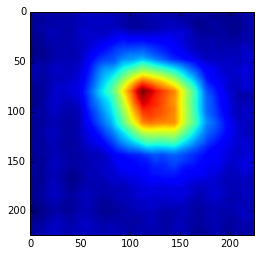

c9: talking to passenger 0.644534


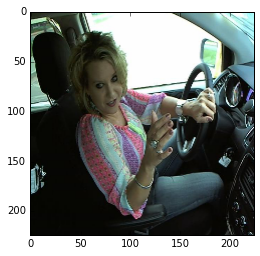

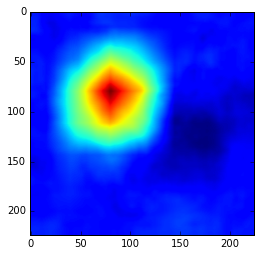

c9: talking to passenger 0.982347


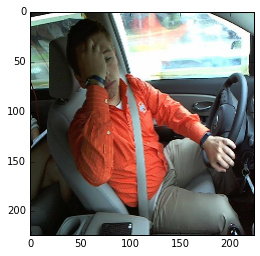

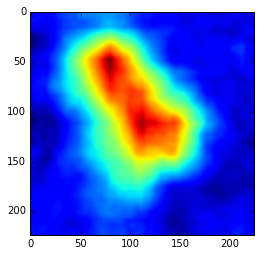

c4: talking on the phone - left 0.999976


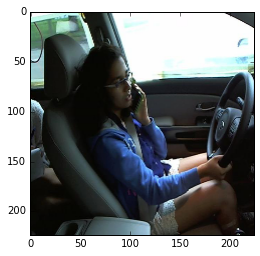

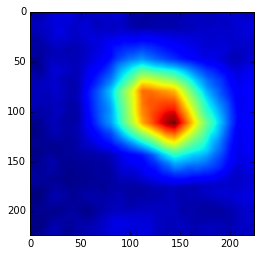

c3: texting - left 0.999441


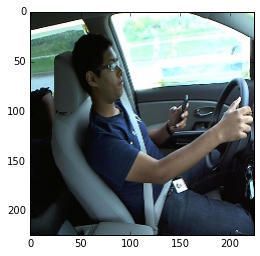

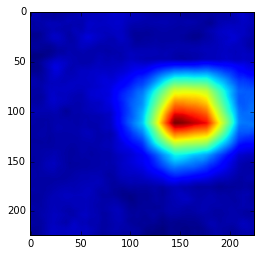

c5: operating the radio 0.999402


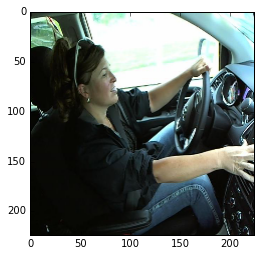

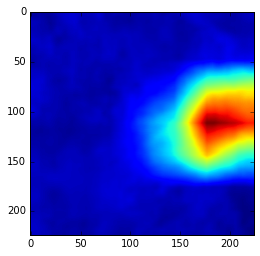

c4: talking on the phone - left 0.999276


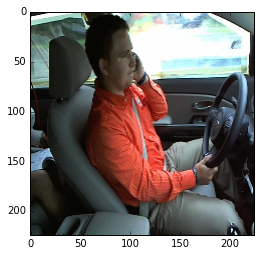

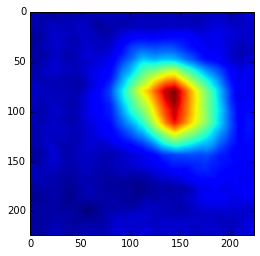

c5: operating the radio 0.637973


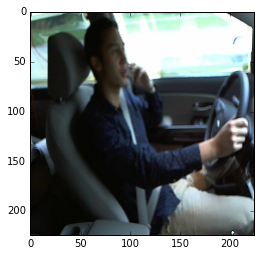

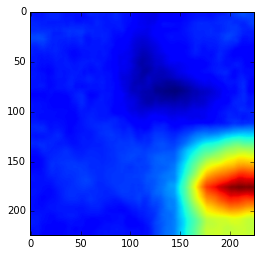

c5: operating the radio 0.91677


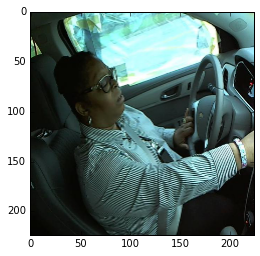

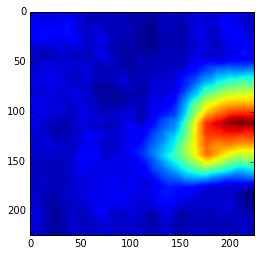

c1: texting - right 0.999833


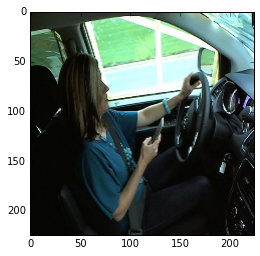

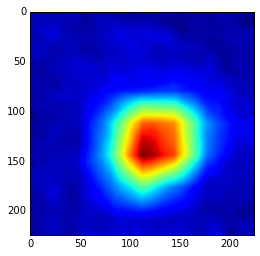

c6: drinking 0.999588


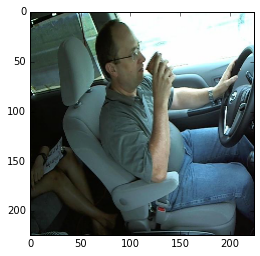

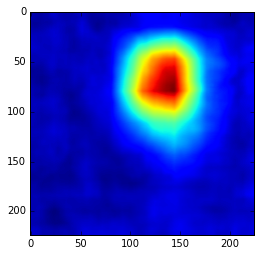

c2: talking on the phone - right 0.997183


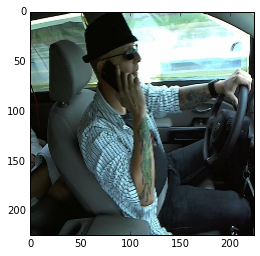

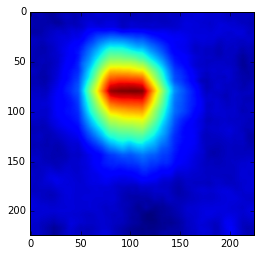

c3: texting - left 0.998166


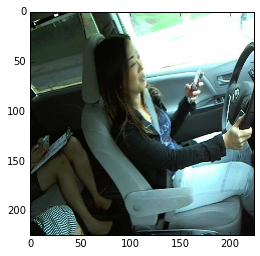

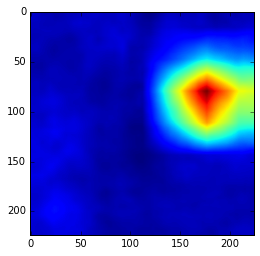

c1: texting - right 0.998601


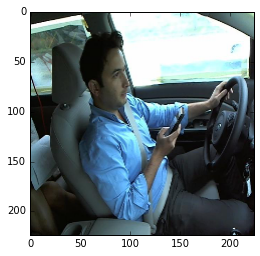

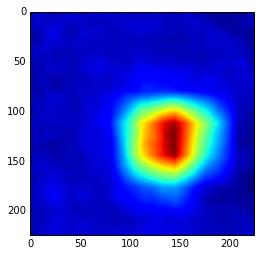

c0: safe driving 0.999409


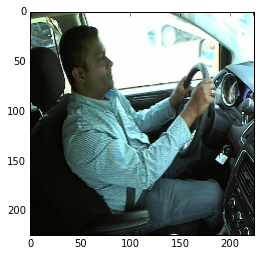

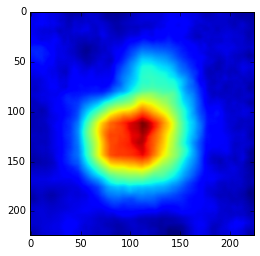

c8: hair and makeup 0.999947


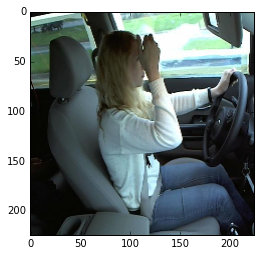

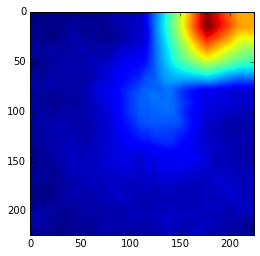

c4: talking on the phone - left 0.999977


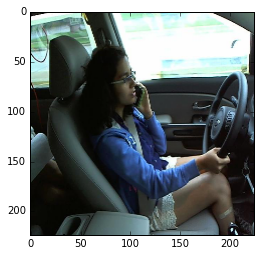

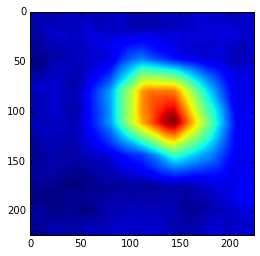

c1: texting - right 0.999783


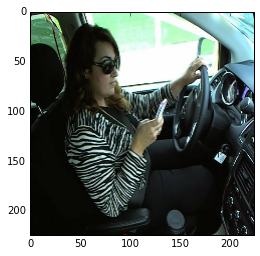

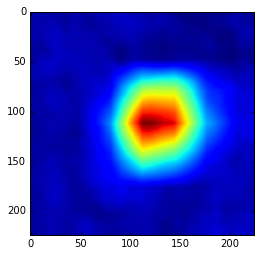

c8: hair and makeup 0.907199


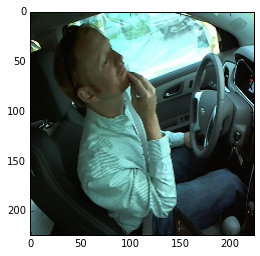

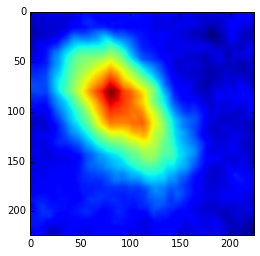

c1: texting - right 0.998136


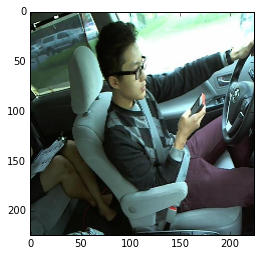

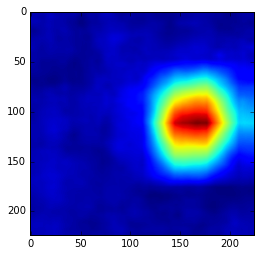

c0: safe driving 0.880727


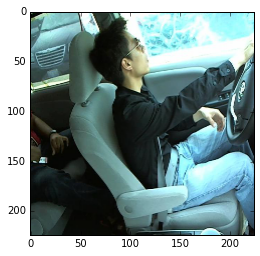

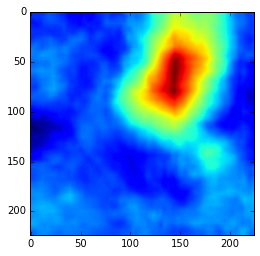

c0: safe driving 0.998059


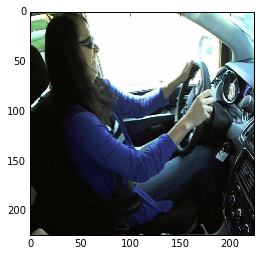

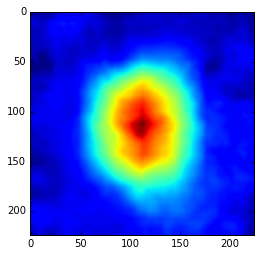

c2: talking on the phone - right 0.999957


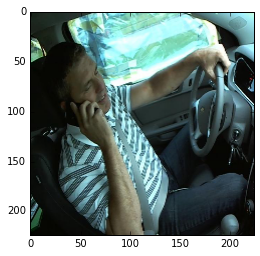

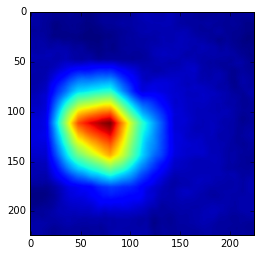

c2: talking on the phone - right 0.999238


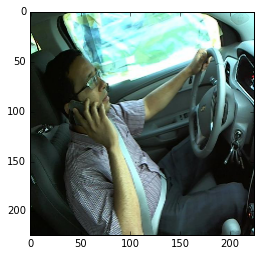

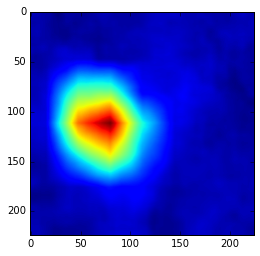

c5: operating the radio 0.999829


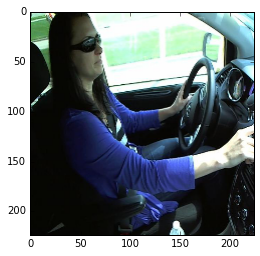

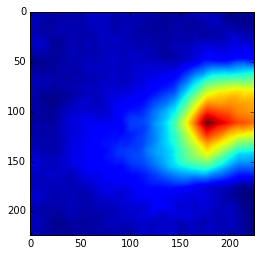

c0: safe driving 0.990464


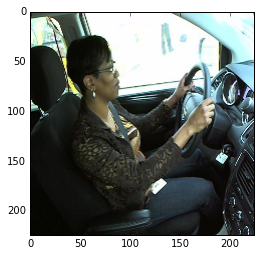

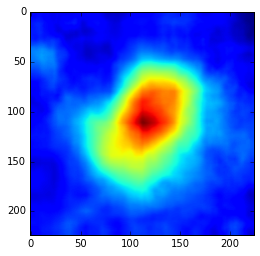

c1: texting - right 0.999878


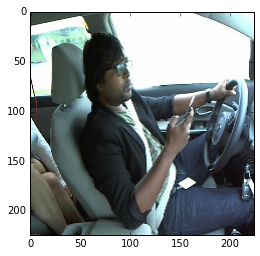

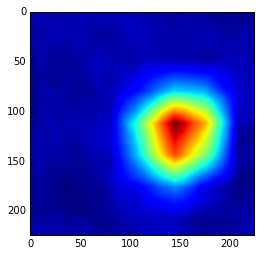

c4: talking on the phone - left 0.995997


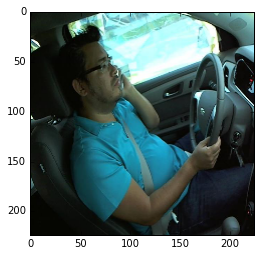

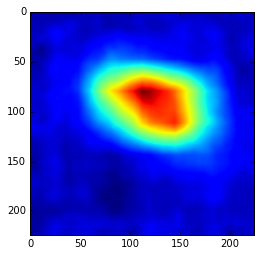

c4: talking on the phone - left 0.994822


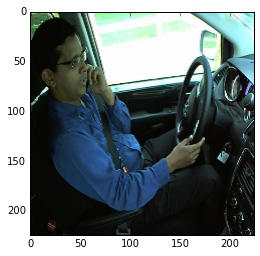

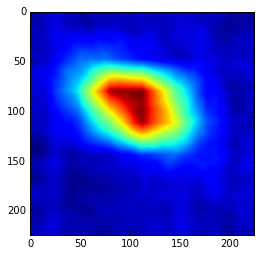

c3: texting - left 0.999133


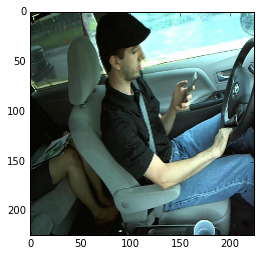

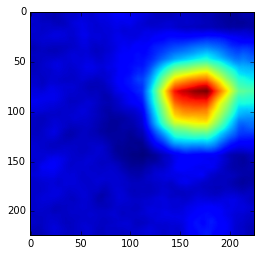

c4: talking on the phone - left 0.999257


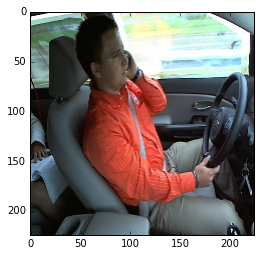

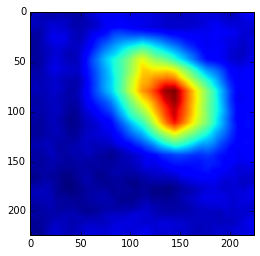

c4: talking on the phone - left 0.886306


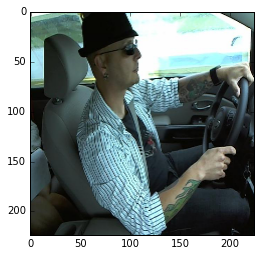

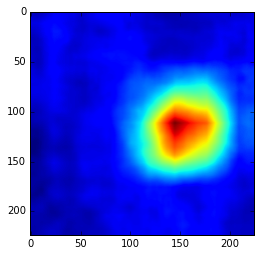

c6: drinking 0.999582


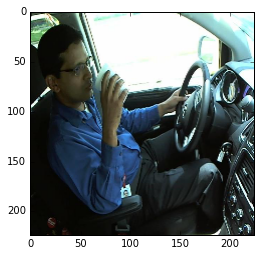

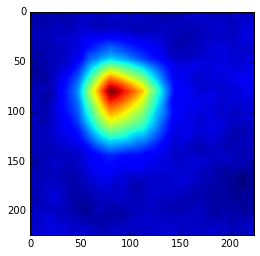

c7: reaching behind 0.999908


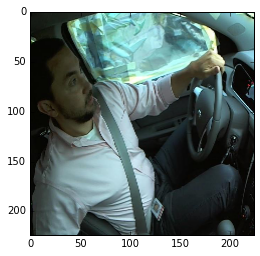

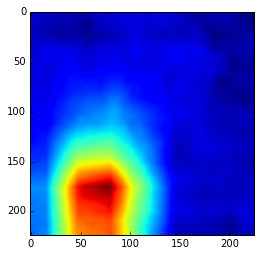

c8: hair and makeup 0.999085


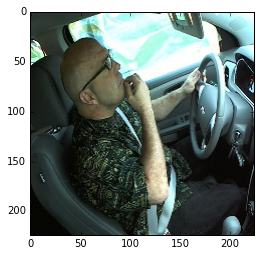

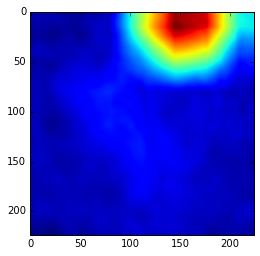

c0: safe driving 0.984745


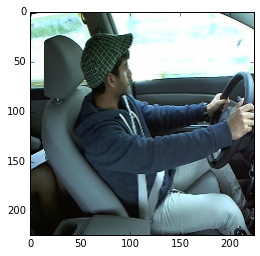

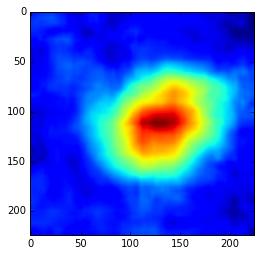

c5: operating the radio 0.999412


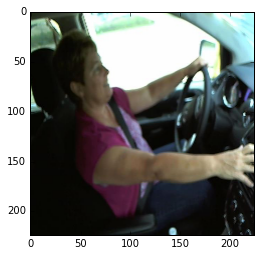

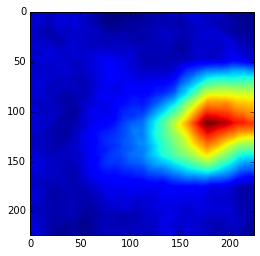

c5: operating the radio 0.998848


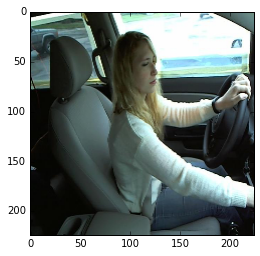

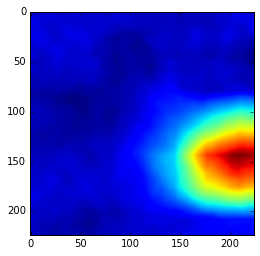

c9: talking to passenger 0.999346


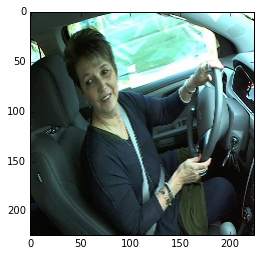

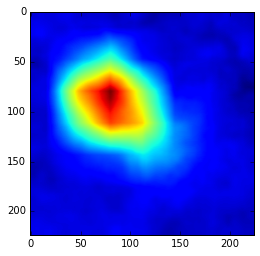

c2: talking on the phone - right 0.998696


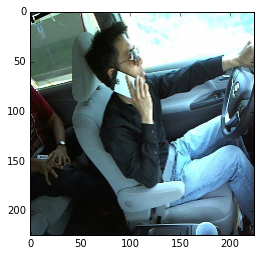

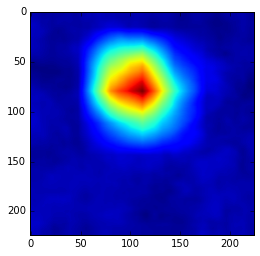

c7: reaching behind 0.999964


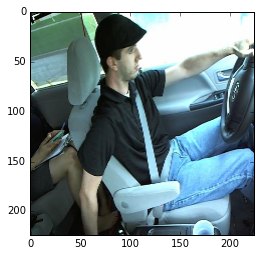

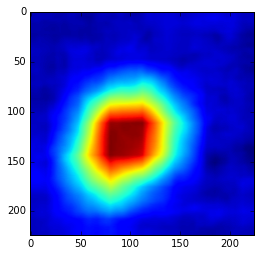

c1: texting - right 0.880777


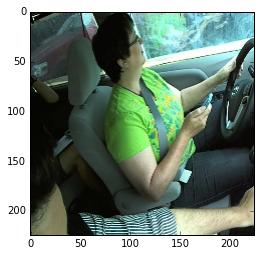

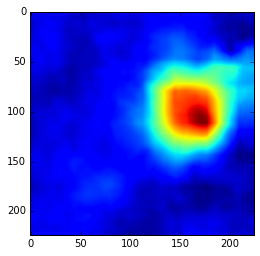

c6: drinking 0.993642


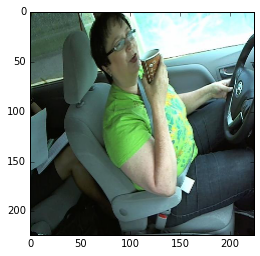

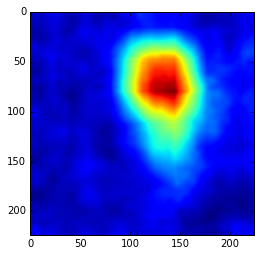

c3: texting - left 0.999867


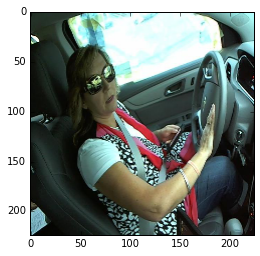

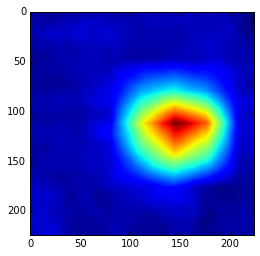

c1: texting - right 0.69568


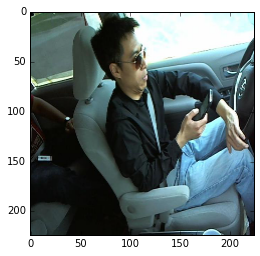

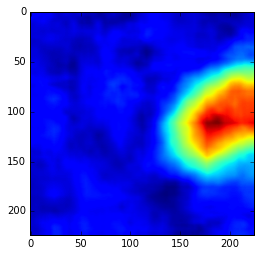

c7: reaching behind 0.998131


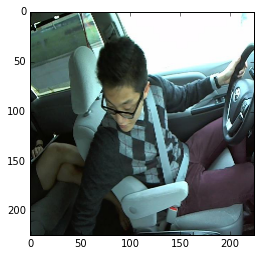

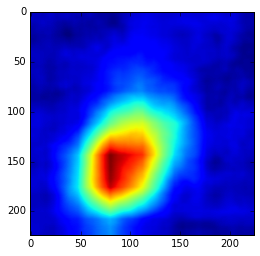

c1: texting - right 0.994636


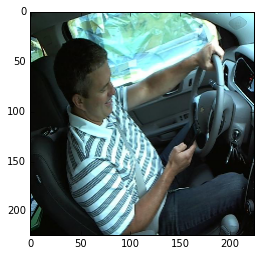

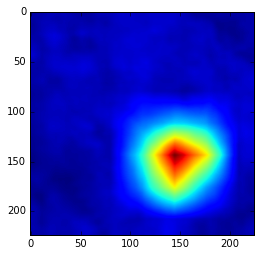

In [73]:
for i in np.random.randint(0, len(test_sets), 100):
    src = cv2.imread(test_sets[i]).astype(np.float64)
    mean = np.load('../data/mean.npy')
    x_data = cv2.resize(src - mean, (224, 224)).transpose(2, 0, 1)
    x_data = Variable(x_data[np.newaxis, :, :, :].astype(np.float32), volatile='on')
    
    h = model(x_data)
    h2, h3, h4, h5 = h
    h = gap.predictor(h)
    tmp2 = np.zeros((1, 10, 56, 56), dtype=np.float32)
    for c in range(1):
        for j in range(10):
            for i in range(256):
                tmp2[c, j, :, :] += h2.data[c, i, :, :] * gap.predictor.fc.W.data[j, i]
    tmp3 = np.zeros((1, 10, 28, 28), dtype=np.float32)
    for c in range(1):
        for j in range(10):
            for i in range(512):
                tmp3[c, j, :, :] += h3.data[c, i, :, :] * gap.predictor.fc.W.data[j, i+256]
    tmp4 = np.zeros((1, 10, 14, 14), dtype=np.float32)
    for c in range(1):
        for j in range(10):
            for i in range(1024):
                tmp4[c, j, :, :] += h4.data[c, i, :, :] * gap.predictor.fc.W.data[j, i+256+512]
    tmp5 = np.zeros((1, 10, 7, 7), dtype=np.float32)
    for c in range(1):
        for j in range(10):
            for i in range(2048):
                tmp5[c, j, :, :] += h5.data[c, i, :, :] * gap.predictor.fc.W.data[j, i+256+512+1024]
                
    num = h.data.argmax()
    print synsets[num], F.softmax(h).data[0, num]
    
    img = np.zeros((224, 224), dtype=np.float32)
    img += cv2.resize(tmp2[0, num, :, :], (224, 224))
    img += cv2.resize(tmp3[0, num, :, :], (224, 224))
    img += cv2.resize(tmp4[0, num, :, :], (224, 224))
    img += cv2.resize(tmp5[0, num, :, :], (224, 224))

    plt.imshow(cv2.resize(src.astype(np.uint8)[:, :, [2,1,0]], (224, 224)))
    plt.show()
    plt.imshow(img)
    plt.show()